___

<a href='https://github.com/eliasmelul/'> <img src='https://s3.us-east-2.amazonaws.com/wordontheamazon.com/NoMargin_NewLogo.png' style='width: 15em;' align='right' /></a>
# Finding my Schitt's Creek
#### Exploratory Data Analysis
___
<h3 align="right">by Elias Melul, Data Scientist </h3> 

___


In this section, we will explore all the data we have scraped.

---
**Table of Contents**

1. **General Socioeconomic Data**

    -<a href='https://github.com/eliasmelul/finding_schitts/blob/master/general_data_FMSC.ipynb'>Scraping Notebook</a>
    
    -<a href='https://s3.us-east-2.amazonaws.com/www.findingmyschittscreek.com/Data/scraped_datausa.csv'>Direct Download of Data</a>
    
    
2. **Weather Data**

    -<a href='https://github.com/eliasmelul/finding_schitts/blob/master/weather_data_FMSC.ipynb'>Scraping Notebook</a>
    
    -<a href='https://s3.us-east-2.amazonaws.com/www.findingmyschittscreek.com/Data/final_weather_data.csv'>Direct Download of Data</a>    
    
    
3. **Venue Data**

    -<a href='https://github.com/eliasmelul/finding_schitts/blob/master/Foursquare_data_FMSC.ipynb'>Scraping Notebook</a>
    
    -<a href='https://s3.us-east-2.amazonaws.com/www.findingmyschittscreek.com/Data/one_hot_encoded_usa_FS.csv'>Direct Download of Data</a>
    
    
    
    

In [2]:
import pandas as pd # import pandas for dataframes
import numpy as np
import requests
from bs4 import BeautifulSoup
import locale
from datetime import datetime
import re
import matplotlib.pyplot as plt
import seaborn as sns
import json
import folium
from pandas.io.json import json_normalize


import matplotlib.cm as cm
import matplotlib.colors as colors

from IPython.display import HTML, display
from IPython.display import Image 
from IPython.core.display import HTML 

pd.options.display.max_columns = None
pd.options.display.max_rows=None


%matplotlib inline

<h2 id = "GeneralData">EDA: General Socioeconomic Data</h2>

---
Import data first.

In [3]:
datausa_df = pd.read_csv('https://s3.us-east-2.amazonaws.com/www.findingmyschittscreek.com/Data/scraped_datausa.csv', index_col=0)
print(datausa_df.shape)
datausa_df.head()

(4050, 26)


,City,Population,Population Change,Poverty Rate,Median Age,Median Household Income,Median Household Income Change,Number Employees,Number Employees Change,Median Property Value,Median Property Value Change,Average Male Salary,Average Female Salary,Gender Salary Ratio M2F,Gini 2018,Gini Change,Patient to Clinician Ratio,Foreign Born Population Ratio,Citizens Percentage,Total Degrees,Degrees Ratio M2F,Degrees per Capita,Households,People Per House,Homeownership,Commute Time
0,"Alabaster, AL",32567.0,0.923,11.1,37.0,74383.0,1.44,15674.0,-0.716,167800.0,0.902,58549.0,40615.0,1.441561,0.46,0.436681,1166.0,6.130,94.9,3.0,0.000000,0.000092,10800.0,3.015463,82.7,28.7
1,"Alexander City, AL",40756.0,-0.493,21.2,43.3,42181.0,7.07,15317.0,1.450,107000.0,1.710,58549.0,40615.0,1.441561,0.46,0.436681,1535.0,1.350,99.2,350.0,0.612903,0.008588,16400.0,2.485122,71.9,24.5
2,"Aliceville, AL",2466.0,-23.400,34.6,36.3,24097.0,20.90,810.0,-18.600,102800.0,5.440,58549.0,40615.0,1.441561,0.46,0.436681,2981.0,0.243,99.8,0.0,1.000000,NaN,928.0,2.657328,48.4,21.1
3,"Andalusia, AL",8918.0,-1.370,17.3,41.1,36101.0,6.14,3629.0,7.460,110400.0,12.800,58549.0,40615.0,1.441561,0.46,0.436681,1991.0,1.180,99.7,514.0,0.903704,0.057636,3610.0,2.470360,61.3,15.8
4,"Ashland, AL",2113.0,-5.290,24.6,45.7,27264.0,-12.20,868.0,1.640,133000.0,48.400,58549.0,40615.0,1.441561,0.46,0.436681,3389.0,2.980,97.0,0.0,1.000000,NaN,895.0,2.360894,50.8,24.1


Now, lets begin the exploration!

In [19]:
datausa_df.describe()

,Population,Population Change,Poverty Rate,Median Age,Median Household Income,Median Household Income Change,Number Employees,Number Employees Change,Median Property Value,Median Property Value Change,Average Male Salary,Average Female Salary,Gender Salary Ratio M2F,Gini 2018,Gini Change,Patient to Clinician Ratio,Foreign Born Population Ratio,Citizens Percentage,Total Degrees,Degrees Ratio M2F,Degrees per Capita,Households,People Per House,Homeownership,Commute Time
count,4.050000e+03,4050.000000,4050.000000,4050.000000,4050.000000,4050.000000,4.050000e+03,4050.000000,4.050000e+03,4050.000000,4050.000000,4050.000000,4050.000000,4050.000000,4050.000000,4050.000000,4050.000000,4050.000000,4050.000000,4050.000000,1093.000000,4.050000e+03,4050.000000,4050.000000,4050.000000
mean,3.507636e+04,0.062926,18.215542,39.688963,46787.110617,4.289397,1.655519e+04,1.009077,1.496386e+05,3.244997,63490.903704,46667.953333,1.365295,0.465804,0.014544,2214.170370,5.999323,96.360025,806.473580,0.936645,0.055682,1.328084e+04,2.600494,62.707269,20.339094
std,1.905551e+05,6.092796,9.398761,7.477982,17288.544415,9.486011,9.353685e+04,8.554347,1.287667e+05,16.699449,7107.168132,6241.694619,0.061045,0.016574,0.583497,1989.957075,7.424484,5.060191,4093.104185,0.639734,0.104959,7.195751e+04,0.564405,12.424069,6.061956
min,6.100000e+01,-37.500000,0.164000,14.700000,13272.000000,-41.200000,2.100000e+01,-58.700000,1.580000e+04,-50.200000,52323.000000,36636.000000,1.222949,0.427000,-3.655914,0.000000,0.020400,40.200000,0.000000,0.000000,0.000053,2.500000e+01,1.141210,9.840000,2.600000
25%,1.501500e+03,-1.290000,11.500000,35.100000,35629.500000,0.026000,6.250000e+02,-2.370000,8.430000e+04,-0.492750,58849.000000,42201.000000,1.325756,0.455000,-0.209644,1247.000000,1.462500,95.500000,0.000000,1.000000,0.010804,6.070000e+02,2.314375,54.700000,16.100000
50%,4.269500e+03,-0.123000,16.900000,38.800000,43473.000000,3.585000,1.812000e+03,0.956500,1.142000e+05,2.460000,61348.000000,45809.000000,1.356304,0.466000,0.000000,1716.500000,3.335000,98.200000,0.000000,1.000000,0.026878,1.660000e+03,2.506679,62.700000,19.900000
75%,1.457875e+04,1.290000,23.400000,43.575000,53235.000000,7.505000,6.278750e+03,4.167500,1.665750e+05,5.970000,67678.000000,50667.000000,1.401203,0.476000,0.402414,2534.750000,7.360000,99.400000,36.000000,1.000000,0.061009,5.570000e+03,2.759815,70.900000,23.875000
max,8.400000e+06,66.700000,73.100000,72.400000,200875.000000,95.600000,4.090000e+06,95.000000,2.000000e+06,943.000000,102125.000000,83099.000000,1.555758,0.504000,3.563474,45996.000000,74.400000,100.000000,147053.000000,29.000000,1.723652,3.180000e+06,12.716129,100.000000,61.400000


**Some things to notice:**
1. The average population is around 35000 and the stabdard deviation is enormous: coefficient of variation is 4.3!. This must mean we are including extremely small towns around the US, which may be problematic when generalizing our recommender system.


The above histogram contains 4050 observations
The above histogram contains 1013 observations
The above histogram contains 203 observations


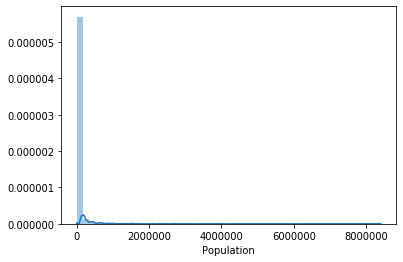

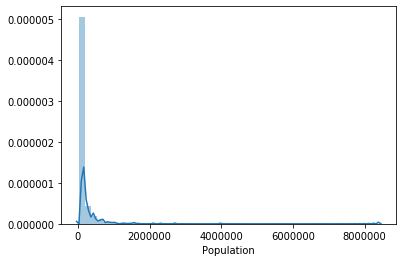

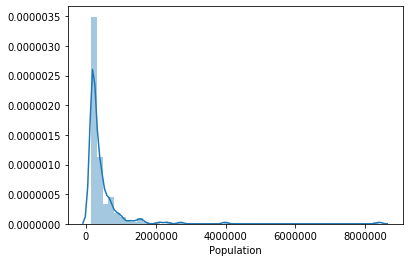

In [73]:
full_hist = sns.distplot(datausa_df['Population'])
print(f"The above histogram contains {datausa_df.shape[0]} observations")

plt.figure()
population_limit = datausa_df.Population.quantile(0.75)
hist1 = datausa_df[datausa_df.Population>population_limit].reset_index()
print(f"The above histogram contains {hist1.shape[0]} observations")
hist50 = sns.distplot(hist1.Population)

plt.figure()
population_limit2 = datausa_df.Population.quantile(0.95)
hist2 = datausa_df[datausa_df.Population>population_limit2].reset_index()
print(f"The above histogram contains {hist2.shape[0]} observations")
hist75 = sns.distplot(hist2.Population)

Wow... so many of our cities have a small population! 
Out of the 4000 cities in our dataset, almost all have less than 100,000 people living in them. 

---

It's clear that the dataset is extremely skewed towards smaller cities. 

**What if we transformed the _Population_ data to logarithmic?**

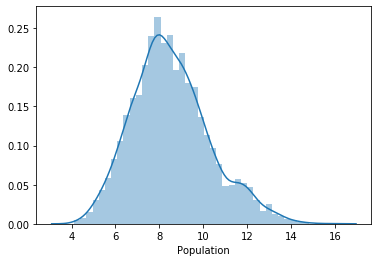

In [76]:
pop = np.log(datausa_df.Population)
sns.distplot(pop)

This looks much more normally distributed!

**Poverty Rate**

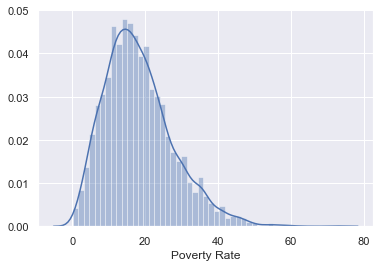

In [129]:
sns.distplot(datausa_df['Poverty Rate'])

The poverty rate distribution is skewed towards the left, but seems quite logical.

---

**Median Household Income**


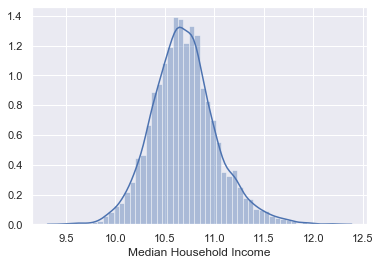

In [119]:
sns.distplot(np.log(datausa_df['Median Household Income']))

**Do richer cities have less populated households?**

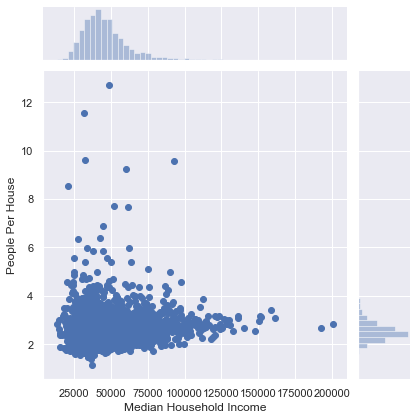

In [115]:
sns.jointplot(x=datausa_df['Median Household Income'], y= datausa_df['People Per House'])

There does seem to be some convergence when median household income increases, where the volatility of the number of people per household decreases relative to the amount of people per household.

---

**How are Property Values and Income Related?**

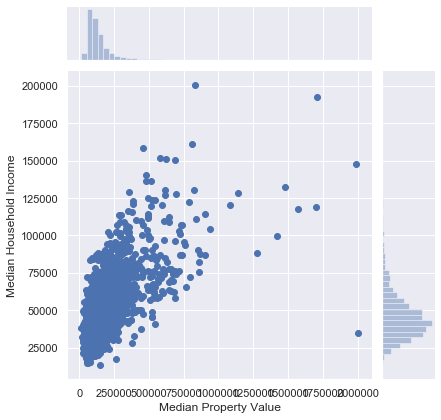

In [130]:
sns.jointplot(x=datausa_df['Median Property Value'],y=datausa_df['Median Household Income'])

**Are lower-income areas more foreign?**

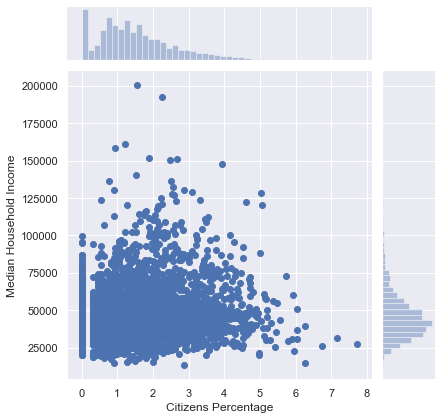

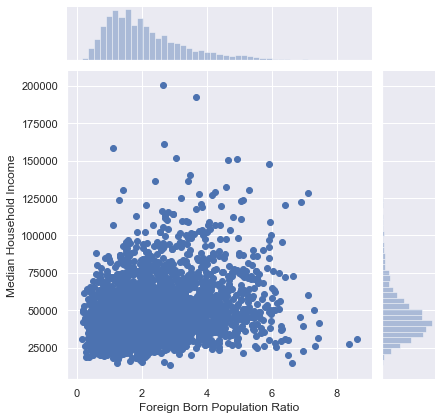

In [141]:
sns.jointplot(x=np.sqrt(100-datausa_df['Citizens Percentage']),y=datausa_df['Median Household Income'])
sns.jointplot(x=np.sqrt(datausa_df['Foreign Born Population Ratio']), y=datausa_df['Median Household Income'])

Based on the raw data, it seems like we need to transform the following values:
    1. Population - logarithmic
    2. Median Household Income - square root
    3. Median Property Value - logarithmic
    4. Patient to clinician ratio - logarithmic
    5. Citizens Percentage - Reflect and logarithmic
    6. People per house - logarithmic
    
Note that we end up combining the income and property features to avoid multicollinearity.

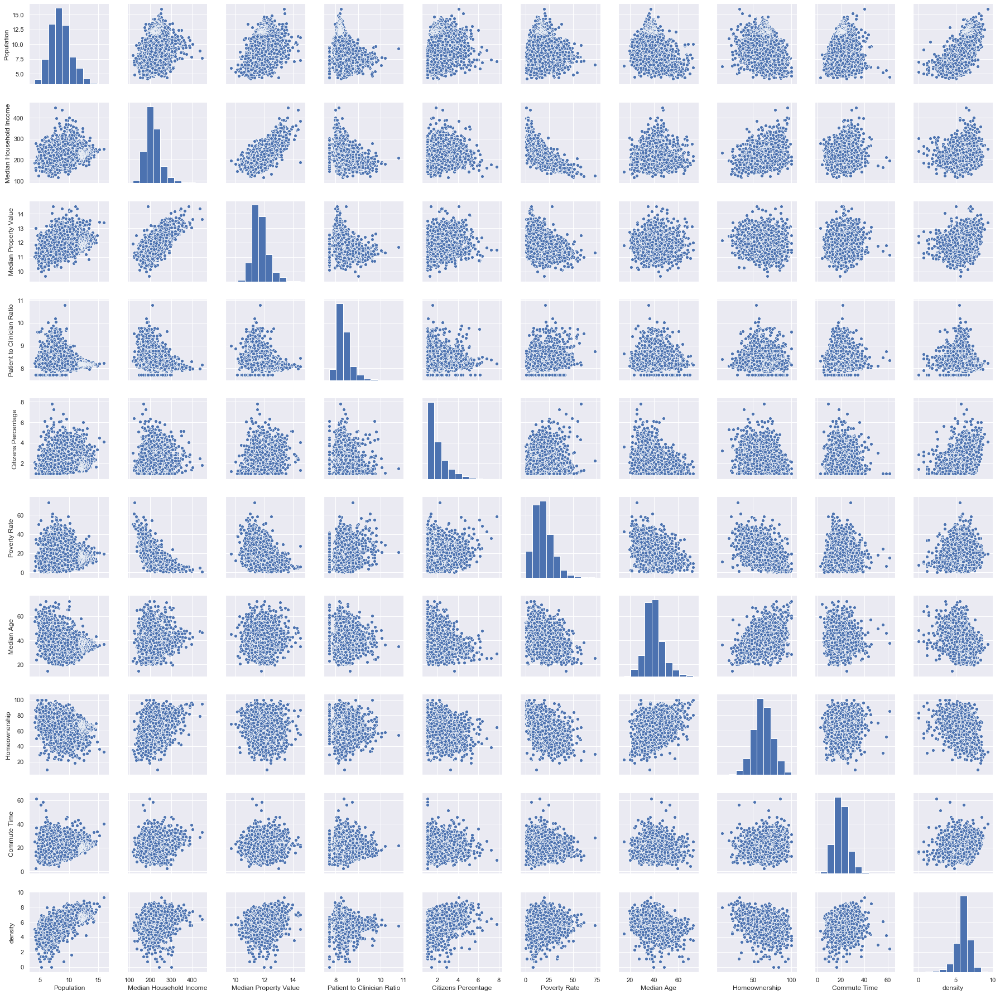

In [314]:
# We would also like population density data, which we are going to append
cities_latlong = pd.read_csv('https://s3.us-east-2.amazonaws.com/www.findingmyschittscreek.com/Data/uscities.csv')
cities_latlong = cities_latlong[['city','state_id','lat','lng','density']]
cities_latlong['City'] = [row.city+", "+row.state_id for i, row in cities_latlong.iterrows()]
cities_latlong = cities_latlong.drop(['city','state_id'],1)

raw_data = datausa_df
raw_data = raw_data.merge(cities_latlong, how='inner', on='City')
raw_data = raw_data.set_index('City')
raw_data = raw_data[['Population','Poverty Rate','Median Age','Median Household Income','Median Property Value','Patient to Clinician Ratio','Citizens Percentage','People Per House','Homeownership','Commute Time','density']]


#Transform the necessary variables
pop_adj = raw_data['Population'].transform(np.log,0)
income_adj = raw_data['Median Household Income'].transform(np.sqrt,0)
property_adj = raw_data['Median Property Value'].transform(np.log,0)
health_adj = (raw_data['Patient to Clinician Ratio'].mean()+raw_data['Patient to Clinician Ratio']).transform(np.log,0)
citizenship_adj = (101-raw_data['Citizens Percentage']).transform(np.sqrt,0)
people_adj = raw_data['People Per House'].transform(np.log,0)
density = (1+raw_data['density']).transform(np.log,0)

#Since we are going to be using regression, we need to avoid multicollinearity which, as we saw above, would occur if we include
#the median household income and property value. Hence we are going to "cheat"
# Create a variable of the proportion of household value that income goes into.
# In other words, how many years of income is necessary to pay off the property (assuming all is disposible income)?
# While this is an unrealistic setting, it could serve as a proxy of benefits versus cost of living - value
#value_index = pd.DataFrame(np.log(raw_data['Median Property Value']/raw_data['Median Household Income']), columns=['Value'])

# Non transformed, put in separate series to concatenate
poverty = raw_data['Poverty Rate']
age = raw_data['Median Age']
home = raw_data['Homeownership']
commute = raw_data['Commute Time']

# Combine all columns into a dataframe
transformed_df = pd.concat([pop_adj,income_adj,property_adj,health_adj,citizenship_adj, poverty, age, home, commute, density], axis=1)

sns.set(font_scale=1)
sns.pairplot(transformed_df)

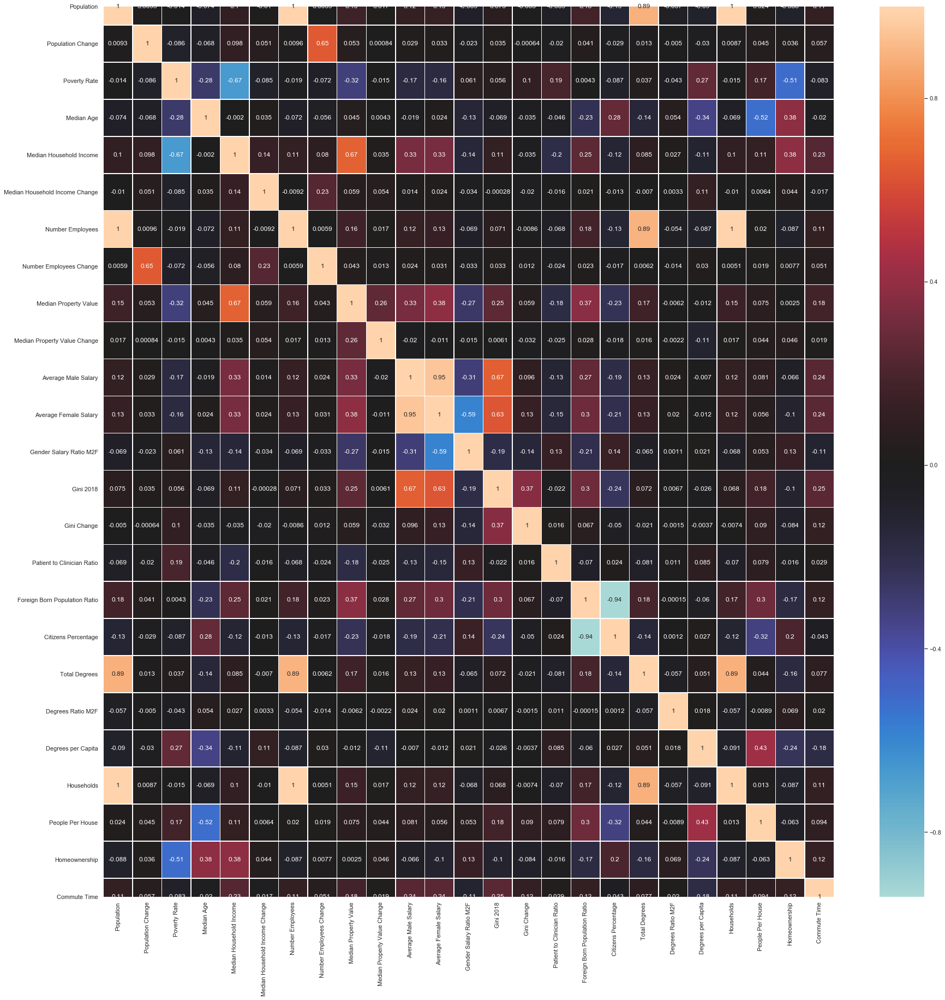

In [304]:
corrMatrix = datausa_df.corr()
plt.figure(figsize=(30,30))
sns.set(font_scale=1)
sns.heatmap(corrMatrix, annot=True, center=0, linewidths=0.5)
plt.show()

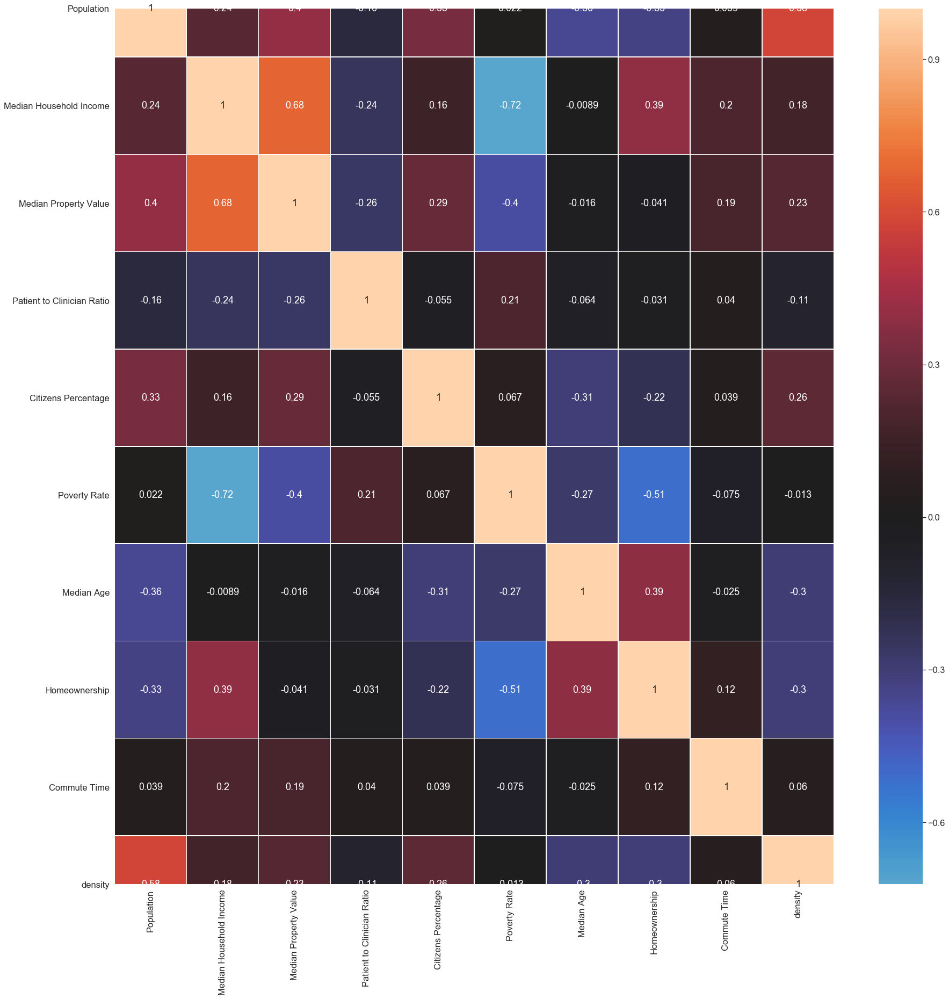

In [315]:
corrMatrix = transformed_df.corr()
plt.figure(figsize=(30,30))
sns.set(font_scale=1.5)
sns.heatmap(corrMatrix, annot=True, center=0, linewidths=0.5)
plt.show()

Now that we have transformed the data, we can observe some correlations with the transformed variables as shown above.

In [316]:
try_df = transformed_df[transformed_df['Population']>11]
try_df.shape

(383, 10)

### DBSCAN on Socioeconomic Metrics

In [317]:
from sklearn.cluster import DBSCAN, KMeans
from sklearn.neighbors import NearestNeighbors
from sklearn.preprocessing import MinMaxScaler
from sklearn.impute import SimpleImputer

In [322]:
X_db = MinMaxScaler().fit_transform(try_df)

cluster_count = []
for i in range(1,100):
    j = i/100
    db_mod = DBSCAN(eps=j, min_samples=5).fit(X_db)
    n_clusters_ = len(set(db_mod.labels_)) - (1 if -1 in db_mod.labels_ else 0)
    quick_dict = {'EPS':j, 'NumberClusters':n_clusters_}
    cluster_count.append(quick_dict)

In [323]:
clusters = pd.DataFrame(cluster_count)
clusters[clusters['NumberClusters']>3]

,EPS,NumberClusters
15,0.16,4
22,0.23,4
23,0.24,4
24,0.25,5


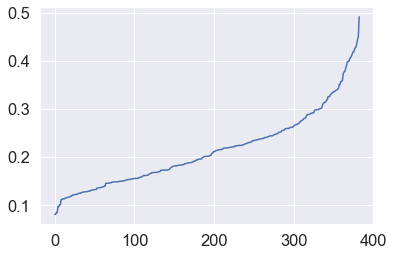

In [324]:
neigh = NearestNeighbors(n_neighbors=2)
nbrs = neigh.fit(X_db)
distances, index = nbrs.kneighbors(X_db)
distances = np.sort(distances, axis=0)
distances = distances[:,1]
plt.plot(distances)

In [326]:
#Build the DBSCAN model based on the defined eps
db_mod = KMeans(n_clusters=8).fit(X_db)
#db_mod = DBSCAN(eps=0.26, min_samples=6).fit(X_db)
n_clusters_ = len(set(db_mod.labels_)) - (1 if -1 in db_mod.labels_ else 0)
#try_df=try_df.drop('Clusters',1)
temp_DBSCAN_df = try_df
temp_DBSCAN_df.insert(0,'Clusters',db_mod.labels_)
temp_DBSCAN_df.head()

#Join dataframe
temp_DBSCAN_df = temp_DBSCAN_df.merge(cities_latlong, how='inner', on='City')
temp_DBSCAN_df.head()

map_clusters = folium.Map(location=[37.0902,-95.7129], zoom_start=4)

# set color scheme for the clusters
x = np.arange(n_clusters_)
ys = [i + x + (i*x)**2 for i in range(n_clusters_)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(temp_DBSCAN_df.lat, temp_DBSCAN_df.lng, temp_DBSCAN_df.City, temp_DBSCAN_df['Clusters']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=8,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters

In [303]:
temp_DBSCAN_df.Clusters.value_counts()

2    80
1    70
6    44
4    44
0    43
5    38
3    37
7    27
Name: Clusters, dtype: int64

<h2 id = "WeatherData">EDA: Weather Data</h2>

In [309]:
weatherData = pd.read_csv('https://s3.us-east-2.amazonaws.com/www.findingmyschittscreek.com/Data/final_weather_data.csv', index_col=0)
weatherData = weatherData.drop('State',1).drop('City',1).drop('State_Abb',1)
weatherData.rename(columns={'CityState':'City'}, inplace=True)
print(weatherData.shape)
weatherData.head()

(5966, 25)


,City,Temp Jan,Temp Feb,Temp Mar,Temp Apr,Temp May,Temp Jun,Temp Jul,Temp Aug,Temp Sep,Temp Oct,Temp Nov,Temp Dec,Swing Jan,Swing Feb,Swing Mar,Swing Apr,Swing May,Swing Jun,Swing Jul,Swing Aug,Swing Sep,Swing Oct,Swing Nov,Swing Dec
0,"Addison, AL",39.5,43.5,51.5,59.5,67.5,74.5,78.5,78.0,71.5,60.5,51.5,42.0,21.0,21.0,23.0,23.0,23.0,21.0,21.0,22.0,23.0,25.0,23.0,20.0
1,"Alabaster, AL",44.0,48.5,55.5,62.5,70.5,77.5,81.0,80.0,74.5,64.0,55.0,46.5,20.0,21.0,23.0,23.0,21.0,19.0,20.0,20.0,21.0,22.0,22.0,19.0
2,"Alexander City, AL",43.5,47.0,54.5,61.5,69.5,77.0,80.0,79.0,73.5,63.0,54.0,45.5,23.0,24.0,27.0,27.0,25.0,22.0,22.0,22.0,23.0,26.0,26.0,23.0
3,"Aliceville, AL",43.5,47.0,55.5,63.0,70.5,78.0,81.0,80.5,74.5,64.0,54.5,45.5,25.0,26.0,27.0,28.0,27.0,24.0,22.0,23.0,25.0,28.0,27.0,25.0
4,"Andalusia, AL",46.5,50.0,56.5,62.5,70.5,77.5,79.5,79.5,75.0,65.0,56.0,49.0,29.0,30.0,31.0,31.0,29.0,25.0,25.0,23.0,26.0,30.0,32.0,28.0


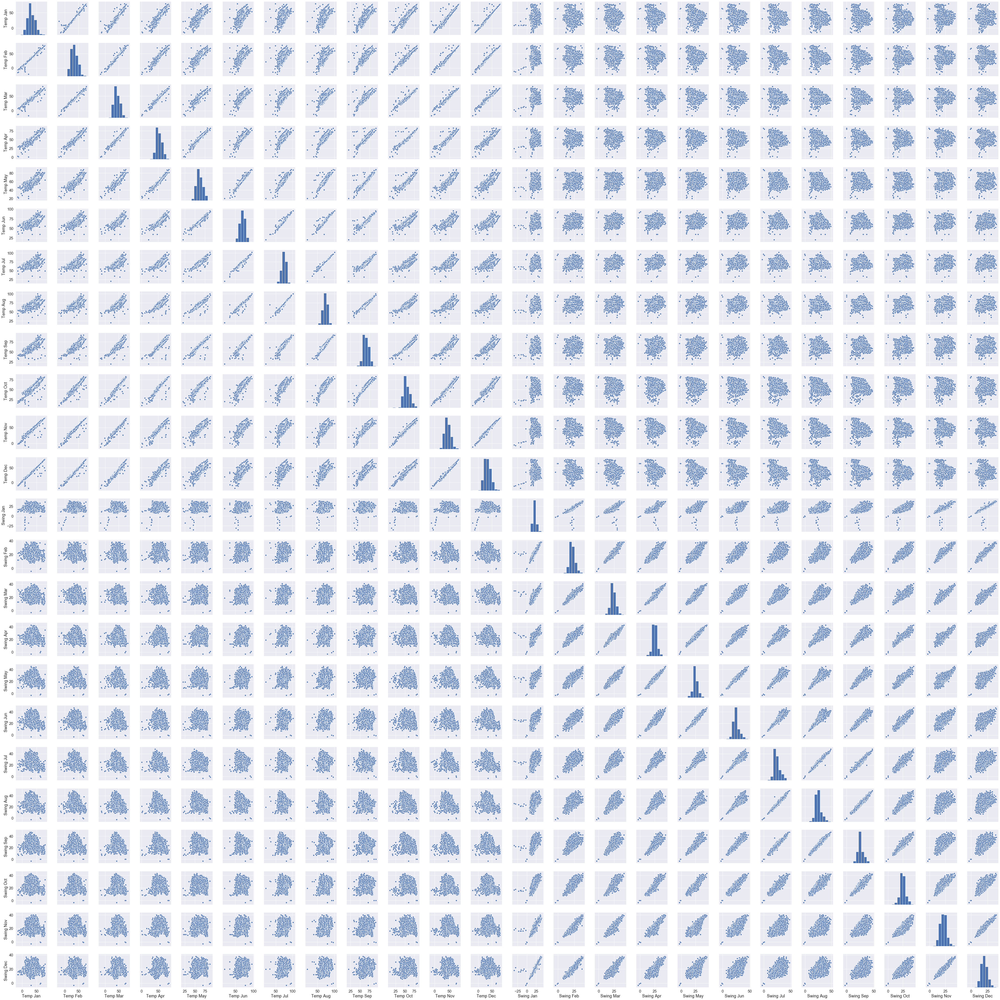

In [327]:
sns.pairplot(weatherData)

We can observe strong correlation between monthly average temperature, month per month. The swing does not seem to have any correlation. Lets make some seasonal temperature variables instead of having monthly values.
1. _Summer:_ June to August
2. _Fall:_ September to November
3. _Winter:_ December to February
4. _Spring:_ March to May

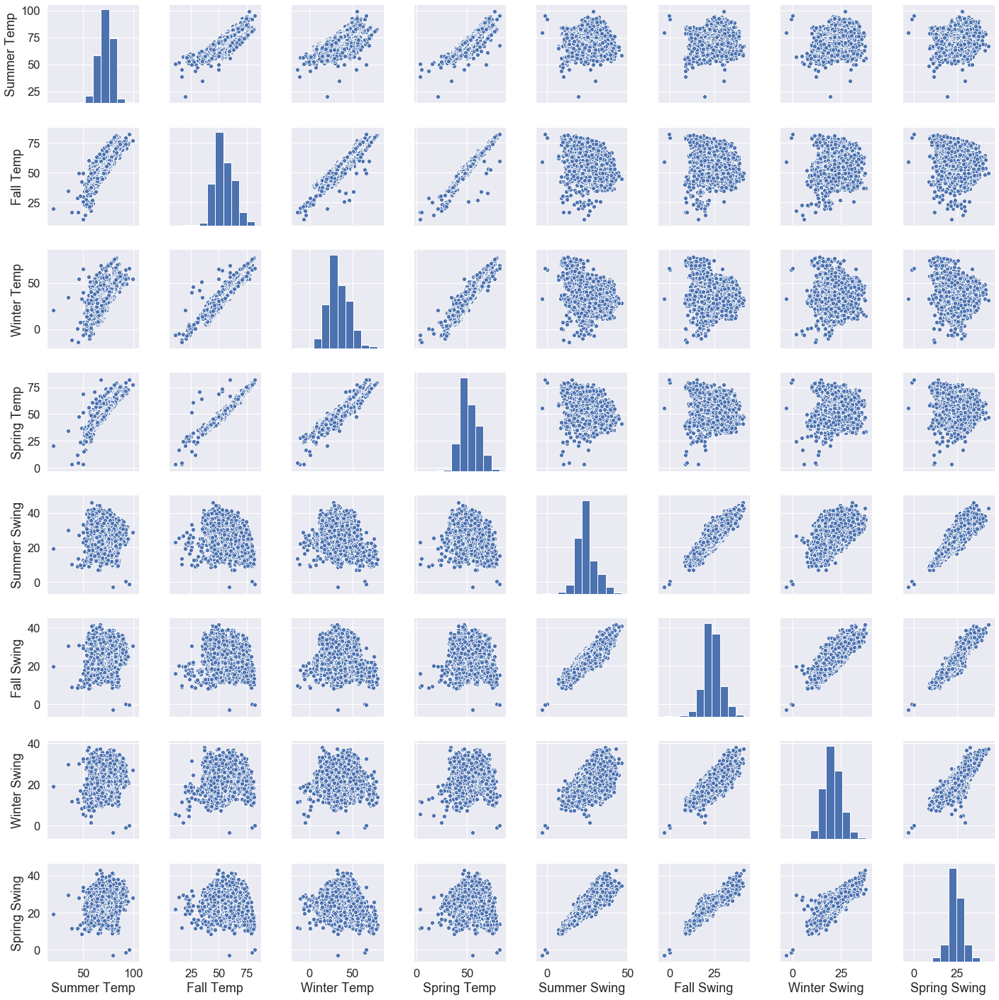

In [428]:
summer_temp = (weatherData['Temp Jun'] + weatherData['Temp Jul'] + weatherData['Temp Aug'])/3
fall_temp = (weatherData['Temp Sep'] + weatherData['Temp Oct'] + weatherData['Temp Nov'])/3
winter_temp = (weatherData['Temp Dec'] + weatherData['Temp Jan'] + weatherData['Temp Feb'])/3
spring_temp = (weatherData['Temp Mar'] + weatherData['Temp Apr'] + weatherData['Temp May'])/3

summer_swing = (weatherData['Swing Jun'] + weatherData['Swing Jul'] + weatherData['Swing Aug'])/3
fall_swing = (weatherData['Swing Sep'] + weatherData['Swing Oct'] + weatherData['Swing Nov'])/3
winter_swing = (weatherData['Swing Dec'] + weatherData['Swing Jan'] + weatherData['Swing Feb'])/3
spring_swing = (weatherData['Swing Mar'] + weatherData['Swing Apr'] + weatherData['Swing May'])/3

newWeather_df = pd.concat([summer_temp, fall_temp, winter_temp, spring_temp, summer_swing, fall_swing, winter_swing, spring_swing], axis=1)
newWeather_df['City'] =weatherData.City
newWeather_df.rename(columns={0:'Summer Temp',1:'Fall Temp',2:'Winter Temp',3:'Spring Temp',4:'Summer Swing',5:'Fall Swing',6:'Winter Swing',7:'Spring Swing'}, inplace=True)
sns.pairplot(newWeather_df)

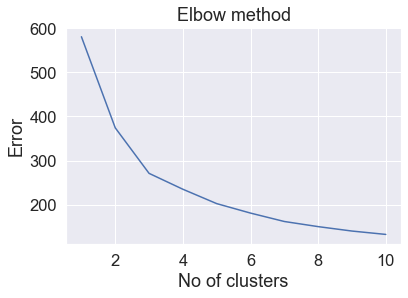

In [429]:
X_w = newWeather_df.drop('City',1)
X_w = MinMaxScaler().fit_transform(X_w)

Error =[]
for i in range(1, 11):
    kmeans = KMeans(n_clusters = i).fit(X_w)
    kmeans.fit(X_w)
    Error.append(kmeans.inertia_)
import matplotlib.pyplot as plt
plt.plot(range(1, 11), Error)
plt.title('Elbow method')
plt.xlabel('No of clusters')
plt.ylabel('Error')
plt.show()


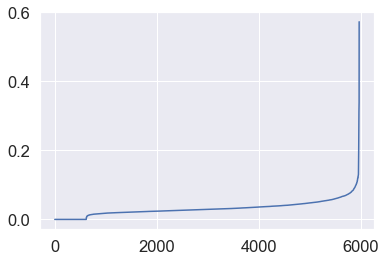

In [430]:
neigh = NearestNeighbors(n_neighbors=2)
nbrs = neigh.fit(X_w)
distances, index = nbrs.kneighbors(X_w)
distances = np.sort(distances, axis=0)
distances = distances[:,1]
plt.plot(distances)

In [436]:
#Build the DBSCAN model based on the defined eps
w_mod = KMeans(5).fit(X_w)
#db_mod = DBSCAN(eps=0.26, min_samples=6).fit(X_db)
#n_clusters_ = len(set(w_mod.labels_)) - (1 if -1 in w_mod.labels_ else 0)
#temp_df=temp_df.drop('Clusters',1)
temp_df = newWeather_df
temp_df['Clusters'] = w_mod.labels_
temp_df.head()

#Join dataframe
temp_df = temp_df.merge(cities_latlong, how='inner', on='City')
temp_df.head()

map_clusters = folium.Map(location=[37.0902,-95.7129], zoom_start=4)

# set color scheme for the clusters
x = np.arange(n_clusters_)
ys = [i + x + (i*x)**2 for i in range(n_clusters_)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(temp_df.lat, temp_df.lng, temp_df.City, temp_df['Clusters']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=4,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters

<h2 id = "WeatherData">EDA: Venue Data</h2>

In [356]:
venueData = pd.read_csv('https://s3.us-east-2.amazonaws.com/www.findingmyschittscreek.com/Data/one_hot_encoded_usa_FS.csv', index_col=0)
print(venueData.shape)
venueData.head()

(3928, 611)


,City,Zoo Exhibit,ATM,Accessories Store,Acupuncturist,Adult Boutique,Advertising Agency,Afghan Restaurant,African Restaurant,Airport,Airport Food Court,Airport Lounge,Airport Service,Airport Terminal,Airport Tram,Alternative Healer,American Restaurant,Amphitheater,Animal Shelter,Antique Shop,Apres Ski Bar,Aquarium,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Assisted Living,Astrologer,Athletics & Sports,Auditorium,Australian Restaurant,Austrian Restaurant,Auto Dealership,Auto Garage,Auto Workshop,Automotive Shop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Basketball Stadium,Bathing Area,Bavarian Restaurant,Bay,Beach,Beach Bar,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Belgian Restaurant,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bike Trail,Bistro,Board Shop,Boarding House,Boat Rental,Boat or Ferry,Bookstore,Border Crossing,Botanical Garden,Boutique,Bowling Alley,Bowling Green,Boxing Gym,Brazilian Restaurant,Breakfast Spot,Brewery,Bridal Shop,Bridge,Bubble Tea Shop,Buffet,Building,Bulgarian Restaurant,Burger Joint,Burmese Restaurant,Burrito Place,Bus Station,Bus Stop,Business Service,Butcher,Cable Car,Cafeteria,Café,Cajun / Creole Restaurant,Cambodian Restaurant,Camera Store,Campground,Canal,Canal Lock,Candy Store,Cantonese Restaurant,Capitol Building,Car Wash,Caribbean Restaurant,Carpet Store,Casino,Castle,Cave,Cemetery,Cheese Shop,Child Care Service,Chinese Restaurant,Chiropractor,Chocolate Shop,Church,Churrascaria,Cidery,City Hall,Climbing Gym,Clothing Store,Club House,Cocktail Bar,Coffee Shop,College Academic Building,College Administrative Building,College Arts Building,College Auditorium,College Baseball Diamond,College Basketball Court,College Bookstore,College Cafeteria,College Communications Building,College Football Field,College Gym,College Hockey Rink,College Library,College Quad,College Rec Center,College Residence Hall,College Soccer Field,College Stadium,College Theater,Colombian Restaurant,Comedy Club,Comfort Food Restaurant,Comic Shop,Community Center,Community College,Concert Hall,Construction & Landscaping,Convenience Store,Convention Center,Cosmetics Shop,Costume Shop,Country Dance Club,Coworking Space,Credit Union,Creperie,Cricket Ground,Cruise,Cuban Restaurant,Cupcake Shop,Curling Ice,Cycle Studio,Dance Studio,Daycare,Deli / Bodega,Dentist's Office,Department Store,Design Studio,Dessert Shop,Dim Sum Restaurant,Diner,Disc Golf,Discount Store,Distillery,Distribution Center,Dive Bar,Dive Shop,Dive Spot,Doctor's Office,Dog Run,Donburi Restaurant,Doner Restaurant,Donut Shop,Drive-in Theater,Drugstore,Dry Cleaner,Dumpling Restaurant,Dutch Restaurant,Duty-free Shop,Eastern European Restaurant,Electronics Store,Elementary School,Emergency Room,Empanada Restaurant,English Restaurant,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Eye Doctor,Fabric Shop,Factory,Fair,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Festival,Field,Filipino Restaurant,Film Studio,Financial or Legal Service,Fire Station,Fireworks Store,Fish & Chips Shop,Fish Market,Fishing Spot,Fishing Store,Flea Market,Flower Shop,Fondue Restaurant,Food,Food & Drink Shop,Food Court,Food Service,Food Stand,Food Truck,Football Stadium,Forest,Fountain,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General College & University,General Entertainment,General Travel,German Restaurant,Gift Shop,Gluten-free Restaurant,Go Kart Track,Golf Course,Golf Driving Range,Gourmet Shop,Government Building,Greek Restaurant,Grocery Store,Gun Range,Gun Shop,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Halal Restaurant,Harbor / Marina,Hardware Store,Hawaiian Restaurant,Health & Beauty Service,Health Food Store,Heliport,Herbs & Spices Store,High School,Hill,Himalayan Restaurant,Historic Site,H

In [416]:
cols = venueData.columns

sumis = []
for col in cols:
    suma = venueData[col].sum()
    dicts = {"VenueType":col,"Freq":suma}
    sumis.append(dicts)

#sumis.sort_values(ascending=False, inplace=True, axis=0)
sumis = sumis[1:]
sumis = pd.DataFrame(sumis).sort_values(ascending=False, by='Freq')
sumis.set_index('VenueType', inplace=True)
sumis['cumPerc'] = sumis['Freq'].cumsum()/sumis['Freq'].sum()*100

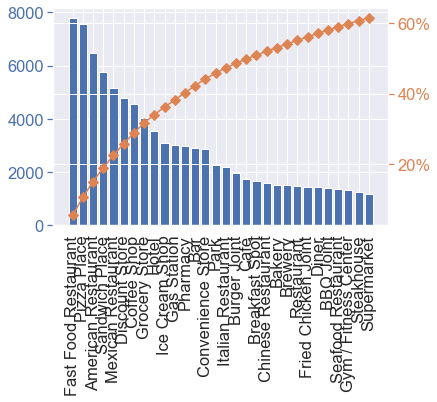

In [453]:
from matplotlib.ticker import PercentFormatter

fig, ax = plt.subplots()
plt.xticks(rotation=90)
ax.bar(sumis[:30].index, sumis[:30]['Freq'], color="C0")
ax2 = ax.twinx()
ax2.plot(sumis[:30].index, sumis[:30]['cumPerc'], color="C1", marker="D", ms=7)
ax2.yaxis.set_major_formatter(PercentFormatter())

ax.tick_params(axis="y", colors="C0")
ax2.tick_params(axis="y", colors="C1")
plt.show()

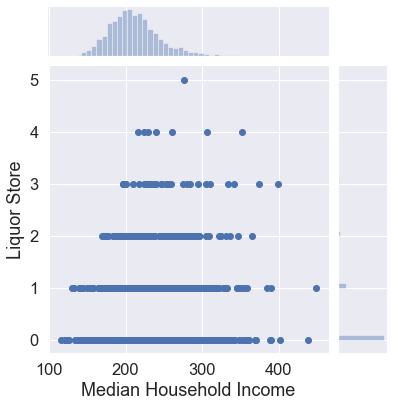

In [452]:
venue_merge = transformed_df.merge(venueData, how='inner', on='City')

sns.jointplot(venue_merge['Median Household Income'], venue_merge['Liquor Store'])

Since the largest 30 venue types account for 60% of the total occurence, we will only keep those columns.

In [471]:
top = sumis[:30]
cols = ['City']
cols = cols + list(top.index)
smallVenues = venueData[cols]
smallVenues.head()

,City,Fast Food Restaurant,Pizza Place,American Restaurant,Sandwich Place,Mexican Restaurant,Discount Store,Coffee Shop,Grocery Store,Hotel,Ice Cream Shop,Gas Station,Pharmacy,Bar,Convenience Store,Park,Italian Restaurant,Burger Joint,Café,Breakfast Spot,Chinese Restaurant,Bakery,Brewery,Restaurant,Fried Chicken Joint,Diner,BBQ Joint,Seafood Restaurant,Gym / Fitness Center,Steakhouse,Supermarket
0,"Abbeville, GA",0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,"Aberdeen, ID",0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,"Aberdeen, MD",3,4,8,3,1,2,1,2,7,1,1,3,0,6,0,2,0,1,1,2,1,0,0,1,1,1,1,2,0,1
3,"Aberdeen, SD",10,5,8,4,3,2,2,2,3,1,1,0,1,1,2,2,1,1,0,1,0,1,0,1,0,0,0,2,1,0
4,"Aberdeen, WA",3,3,1,1,2,1,5,1,2,2,0,2,1,4,1,2,0,1,1,1,0,0,0,1,1,0,1,2,0,0


In [472]:
venueData.shape

(3928, 611)

**Now that we have transformed the data, lets combine it and export it**

In [446]:
all_combined = transformed_df.merge(newWeather_df, how='inner', on='City')
all_combined.drop('Clusters', inplace=True,axis=1)
all_combined = all_combined.merge(venueData,how='inner',on='City')

In [448]:
#all_combined.to_csv("../Desktop/FMSC/all_data_transformed.csv")

In [474]:
allCombinedSmall = transformed_df.merge(newWeather_df, how='inner', on='City')
allCombinedSmall.drop('Clusters', inplace=True,axis=1)
allCombinedSmall = allCombinedSmall.merge(smallVenues,how='inner',on='City')

In [475]:
#allCombinedSmall.to_csv("../Desktop/FMSC/Data/allCombinedSmall.csv")